# The Problem

In this project, we model the optimal foraging behavior of a bee as a 10-armed bandit problem. The bee must choose among 10 different flower species to visit during its foraging flights. Each flower species yields a different, unknown average amount of pollen. The bee's objective is to maximize the total pollen collected over time by balancing the exploitation of known high-yield flower species with the exploration of other species that might offer even greater rewards, assuming an environment where resources replenish rapidly enough to remain constant.

# Stationary Probability Distribution

The reward for selecting a specific flower species follows a stationary probability distribution, meaning the expected pollen yield for each species remains constant throughout the experiment. Specifically, the true expected reward for each of the 10 actions, denoted as *q∗​(a)*, is initially sampled from a standard normal distribution, *N(0,1)*. When the bee selects an action *At*​, the actual reward received, *Rt*​, is drawn from a normal distribution with a mean equal to the selected action's true value *q∗​(At​)* and a variance of 1. This adds Gaussian noise to the system, simulating the natural variability in pollen quantity among individual flowers of the same species, while the underlying average yield remains strictly unchanged.

Recomepsansas: 
[ 0.49671415 -0.1382643   0.64768854  1.52302986 -0.23415337 -0.23413696
  1.57921282  0.76743473 -0.46947439  0.54256004]

STATIONARY DISTRIBUTION ANALYSIS (THE BUMBLEBEE'S ENVIRONMENT)


This plot illustrates the stationary testbed of the 10-armed bandit problem.
- X-axis (Flower Species): Represents the 10 possible discrete actions.
- Y-axis (Reward R_t): Represents the continuous reward space (pollen quantity).

The dashed red lines indicate the true, hidden average value of each species,
q*(a), initially generated from a standard normal distribution N(0, 1). The
blue areas ('violins') show the distribution of the actual reward R_t that the
bumblebee experiences on each visit, which includes Gaussian noise:
R_t ~ N(q*(a), 1).

The critical aspect of this model is the overlap between the blue density areas.
Due to natural variance, a flower from a genetically inferior species can
occasionally offer more pollen than a flower from the optimal species that had
bad luck.

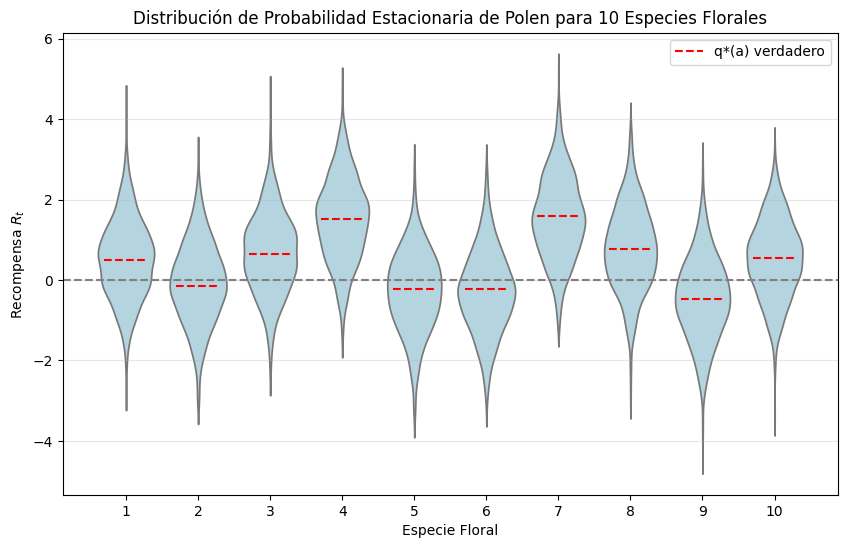

In [3]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
np.random.seed(42)

k = 10
q_star = np.random.normal(loc=0.0, scale=1.0, size=k)

print("Recomepsansas: ")
print(q_star)

data = []

for i in range(k):
  samples = np.random.normal(loc=q_star[i], scale=1.0, size=1000)
  for sample in samples:
    data.append({'Especie Floral': i + 1, 'Recompensa de Polen': sample})

df = pd.DataFrame(data)
plt.figure(figsize=(10, 6))
sns.violinplot(x='Especie Floral', y='Recompensa de Polen', data=df, color='lightblue', inner=None)


for i in range(k):
    plt.hlines(q_star[i], i - 0.3, i + 0.3, colors='red', linestyles='dashed', label='q*(a) verdadero' if i == 0 else "")

plt.axhline(0, color='gray', linestyle='--')
plt.title('Distribución de Probabilidad Estacionaria de Polen para 10 Especies Florales')
plt.xlabel('Especie Floral')
plt.ylabel('Recompensa $R_t$')
plt.legend()
plt.grid(axis='y', alpha=0.3)

explicacion_distribucion_en = """
================================================================================
STATIONARY DISTRIBUTION ANALYSIS (THE BUMBLEBEE'S ENVIRONMENT)
================================================================================


This plot illustrates the stationary testbed of the 10-armed bandit problem.
- X-axis (Flower Species): Represents the 10 possible discrete actions.
- Y-axis (Reward R_t): Represents the continuous reward space (pollen quantity).

The dashed red lines indicate the true, hidden average value of each species,
q*(a), initially generated from a standard normal distribution N(0, 1). The
blue areas ('violins') show the distribution of the actual reward R_t that the
bumblebee experiences on each visit, which includes Gaussian noise:
R_t ~ N(q*(a), 1).

The critical aspect of this model is the overlap between the blue density areas.
Due to natural variance, a flower from a genetically inferior species can
occasionally offer more pollen than a flower from the optimal species that had
bad luck. This stochastic "deception" is exactly what forces the agent to
maintain a mathematical balance between exploration and exploitation, rather
than blindly trusting a single greedy observation, to avoid getting trapped in
a suboptimal patch.
================================================================================
"""

print(explicacion_distribucion_en)

plt.show()

# The sample average method with a random selection policy

# 500 pasos

In [4]:
import random

class flower:
  def __init__(self, name, real_prob):
        self.name = name
        self.real_prob = real_prob

        self.q_value = 0.0  # Initial estimate of the value of the flower
        self.count = 0      # Number of times the flower has been used
        self.accum_reward = 0.0  # Total reward obtained from this flower

  def try_flower(self):
        # Simulate trying the flower
        if random.random() < self.real_prob:
            return 1
        else:
            return 0

  def learn(self, reward):
        # Update the Q-value based on the received reward
        self.count += 1
        self.accum_reward += reward
        if self.count > 0:
            self.q_value = self.accum_reward / self.count  # Update Q-value as average reward

  def __str__(self):
        return f"Flower {self.name} -> Q: {self.q_value:.4f} (Chosen {self.count} times)"

flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 500
for t in range(1, n_steps+1):
    selected_flower = random.choice(flowers)
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)

import matplotlib.pyplot as plt
import plotly.express as px


explicacion_graficas_en = """
================================================================================
ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), the
distribution on the Y-axis should be approximately uniform (flat bars).
Ecologically, this represents a bumblebee foraging blindly, failing to leverage
its memory to discriminate between high-yield and low-yield nectar patches.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

- X-axis (Step): Represents the progression of discrete simulation time (the
  successive foraging flights of the bumblebee, from t=1 to t=N).
- Y-axis (Q-value): Represents the Q_t(a) variable, which is the internal
  estimate the agent has calculated regarding the average amount of pollen
  offered by each flower species.
Behavior: In the early steps along the X-axis, the lines are highly erratic due
to the natural variance of the stochastic environment. However, as time
progresses, the estimates for each species stabilize horizontally, converging
towards their true, hidden expected value q*(a). Paradoxically, the random agent
learns the absolute truth of its environment, but its random policy prevents it
from exploiting this valuable knowledge.

3. ACCUMULATED REWARDS (Graph 3)
- X-axis (Step): Represents the progression of discrete time in the simulation.
- Y-axis (Accumulated Reward): Represents the global performance metric of the
  system. It is the TOTAL sum of pollen collected exclusively by the agent (the
  bumblebee) from step 0 up to the current step t.
Behavior: Since there is no optimization process (the agent does not
preferentially choose the highest-yielding flowers), the collection rate is
simply the global mean of the environment's rewards. Visually, the agent's
performance is plotted as a straight diagonal line with a constant, suboptimal
slope, completely lacking the exponential acceleration curve typical of an
algorithm that truly learns and exploits.
================================================================================
"""

print(explicacion_graficas_en)

Flower Black-Eyed Susan -> Q: 0.6607 (Chosen 56 times)
Flower Coreopsis -> Q: 0.4222 (Chosen 45 times)
Flower Sweet Alyssum -> Q: 0.2381 (Chosen 42 times)
Flower Perennial Salvia -> Q: 0.1698 (Chosen 53 times)
Flower Snapdragon -> Q: 0.7200 (Chosen 50 times)
Flower Sage -> Q: 0.1429 (Chosen 49 times)
Flower Coneflower -> Q: 0.8364 (Chosen 55 times)
Flower Bee Balm -> Q: 0.4706 (Chosen 51 times)
Flower Creeping Thyme -> Q: 0.5000 (Chosen 48 times)
Flower Lavender -> Q: 0.2745 (Chosen 51 times)

ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), the
d

In [5]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [6]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [7]:
#Grafica de las recompensas actualizadas

acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 1000 pasos

In [8]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 1000
for t in range(1, n_steps+1):
    selected_flower = random.choice(flowers)
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)
flower_index = {flower.name: i for i, flower in enumerate(flowers)}
history_numeric = [flower_index[name] for name in tried_flower_history]

explicacion_graficas_en = """
================================================================================
ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), the
distribution on the Y-axis should be approximately uniform (flat bars).
Ecologically, this represents a bumblebee foraging blindly, failing to leverage
its memory to discriminate between high-yield and low-yield nectar patches.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

- X-axis (Step): Represents the progression of discrete simulation time (the
  successive foraging flights of the bumblebee, from t=1 to t=N).
- Y-axis (Q-value): Represents the Q_t(a) variable, which is the internal
  estimate the agent has calculated regarding the average amount of pollen
  offered by each flower species.
Behavior: In the early steps along the X-axis, the lines are highly erratic due
to the natural variance of the stochastic environment. However, as time
progresses, the estimates for each species stabilize horizontally, converging
towards their true, hidden expected value q*(a). Paradoxically, the random agent
learns the absolute truth of its environment, but its random policy prevents it
from exploiting this valuable knowledge.

3. ACCUMULATED REWARDS (Graph 3)
- X-axis (Step): Represents the progression of discrete time in the simulation.
- Y-axis (Accumulated Reward): Represents the global performance metric of the
  system. It is the TOTAL sum of pollen collected exclusively by the agent (the
  bumblebee) from step 0 up to the current step t.
Behavior: Since there is no optimization process (the agent does not
preferentially choose the highest-yielding flowers), the collection rate is
simply the global mean of the environment's rewards. Visually, the agent's
performance is plotted as a straight diagonal line with a constant, suboptimal
slope, completely lacking the exponential acceleration curve typical of an
algorithm that truly learns and exploits.
================================================================================
"""

print(explicacion_graficas_en)


Flower Black-Eyed Susan -> Q: 0.7010 (Chosen 97 times)
Flower Coreopsis -> Q: 0.4712 (Chosen 104 times)
Flower Sweet Alyssum -> Q: 0.3613 (Chosen 119 times)
Flower Perennial Salvia -> Q: 0.2396 (Chosen 96 times)
Flower Snapdragon -> Q: 0.6064 (Chosen 94 times)
Flower Sage -> Q: 0.1809 (Chosen 94 times)
Flower Coneflower -> Q: 0.7568 (Chosen 111 times)
Flower Bee Balm -> Q: 0.4842 (Chosen 95 times)
Flower Creeping Thyme -> Q: 0.6087 (Chosen 92 times)
Flower Lavender -> Q: 0.3571 (Chosen 98 times)

ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), th

In [9]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [10]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [11]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 5000 pasos

In [12]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]
tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 5000
for t in range(1, n_steps+1):
    selected_flower = random.choice(flowers)
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)
flower_index = {flower.name: i for i, flower in enumerate(flowers)}
history_numeric = [flower_index[name] for name in tried_flower_history]


explicacion_graficas_en = """
================================================================================
ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), the
distribution on the Y-axis should be approximately uniform (flat bars).
Ecologically, this represents a bumblebee foraging blindly, failing to leverage
its memory to discriminate between high-yield and low-yield nectar patches.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

- X-axis (Step): Represents the progression of discrete simulation time (the
  successive foraging flights of the bumblebee, from t=1 to t=N).
- Y-axis (Q-value): Represents the Q_t(a) variable, which is the internal
  estimate the agent has calculated regarding the average amount of pollen
  offered by each flower species.
Behavior: In the early steps along the X-axis, the lines are highly erratic due
to the natural variance of the stochastic environment. However, as time
progresses, the estimates for each species stabilize horizontally, converging
towards their true, hidden expected value q*(a). Paradoxically, the random agent
learns the absolute truth of its environment, but its random policy prevents it
from exploiting this valuable knowledge.

3. ACCUMULATED REWARDS (Graph 3)
- X-axis (Step): Represents the progression of discrete time in the simulation.
- Y-axis (Accumulated Reward): Represents the global performance metric of the
  system. It is the TOTAL sum of pollen collected exclusively by the agent (the
  bumblebee) from step 0 up to the current step t.
Behavior: Since there is no optimization process (the agent does not
preferentially choose the highest-yielding flowers), the collection rate is
simply the global mean of the environment's rewards. Visually, the agent's
performance is plotted as a straight diagonal line with a constant, suboptimal
slope, completely lacking the exponential acceleration curve typical of an
algorithm that truly learns and exploits.
================================================================================
"""
print(explicacion_graficas_en)


Flower Black-Eyed Susan -> Q: 0.7722 (Chosen 496 times)
Flower Coreopsis -> Q: 0.5189 (Chosen 503 times)
Flower Sweet Alyssum -> Q: 0.3307 (Chosen 511 times)
Flower Perennial Salvia -> Q: 0.2259 (Chosen 478 times)
Flower Snapdragon -> Q: 0.6801 (Chosen 497 times)
Flower Sage -> Q: 0.1432 (Chosen 475 times)
Flower Coneflower -> Q: 0.7804 (Chosen 501 times)
Flower Bee Balm -> Q: 0.4890 (Chosen 499 times)
Flower Creeping Thyme -> Q: 0.6692 (Chosen 520 times)
Flower Lavender -> Q: 0.3327 (Chosen 520 times)

ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Explorati

In [13]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [14]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [15]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 10000 pasos

In [16]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 10000
for t in range(1, n_steps+1):
    selected_flower = random.choice(flowers)
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)
flower_index = {flower.name: i for i, flower in enumerate(flowers)}
history_numeric = [flower_index[name] for name in tried_flower_history]

explicacion_graficas_en = """
================================================================================
ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Exploration), the
distribution on the Y-axis should be approximately uniform (flat bars).
Ecologically, this represents a bumblebee foraging blindly, failing to leverage
its memory to discriminate between high-yield and low-yield nectar patches.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

- X-axis (Step): Represents the progression of discrete simulation time (the
  successive foraging flights of the bumblebee, from t=1 to t=N).
- Y-axis (Q-value): Represents the Q_t(a) variable, which is the internal
  estimate the agent has calculated regarding the average amount of pollen
  offered by each flower species.
Behavior: In the early steps along the X-axis, the lines are highly erratic due
to the natural variance of the stochastic environment. However, as time
progresses, the estimates for each species stabilize horizontally, converging
towards their true, hidden expected value q*(a). Paradoxically, the random agent
learns the absolute truth of its environment, but its random policy prevents it
from exploiting this valuable knowledge.

3. ACCUMULATED REWARDS (Graph 3)
- X-axis (Step): Represents the progression of discrete time in the simulation.
- Y-axis (Accumulated Reward): Represents the global performance metric of the
  system. It is the TOTAL sum of pollen collected exclusively by the agent (the
  bumblebee) from step 0 up to the current step t.
Behavior: Since there is no optimization process (the agent does not
preferentially choose the highest-yielding flowers), the collection rate is
simply the global mean of the environment's rewards. Visually, the agent's
performance is plotted as a straight diagonal line with a constant, suboptimal
slope, completely lacking the exponential acceleration curve typical of an
algorithm that truly learns and exploits.
================================================================================
"""
print(explicacion_graficas_en)


Flower Black-Eyed Susan -> Q: 0.7490 (Chosen 1008 times)
Flower Coreopsis -> Q: 0.5015 (Chosen 979 times)
Flower Sweet Alyssum -> Q: 0.2872 (Chosen 982 times)
Flower Perennial Salvia -> Q: 0.2045 (Chosen 1061 times)
Flower Snapdragon -> Q: 0.6526 (Chosen 970 times)
Flower Sage -> Q: 0.1681 (Chosen 1029 times)
Flower Coneflower -> Q: 0.7706 (Chosen 981 times)
Flower Bee Balm -> Q: 0.4384 (Chosen 999 times)
Flower Creeping Thyme -> Q: 0.6244 (Chosen 1017 times)
Flower Lavender -> Q: 0.2957 (Chosen 974 times)

ANALYSIS OF THE RANDOM POLICY AGENT AND AXES DESCRIPTION (BASELINE)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
- X-axis (Flowers): Represents the discrete action space, meaning the 10 options
  (flower species) the agent can choose from.
- Y-axis (Number of times tried): Represents the absolute frequency of selection,
  indicating how many times the bumblebee decided to visit each species throughout
  the simulation.
Behavior: By using a purely random selection policy (Random Explo

In [17]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [18]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [19]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# Percentage of optimal action for 2000 runs

In [20]:
explicacion_grafica4_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.
================================================================================
"""

print(explicacion_grafica4_en)

runs = 2000
n_steps = 1000

optimal_index = np.argmax([f.real_prob for f in flowers])

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):
        selected_index = random.randrange(len(flowers))
        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

# Calcular porcentaje
percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (2000 runs)"
)

fig.show()


OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.



In [21]:
explicacion_grafica4_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.
================================================================================
"""

print(explicacion_grafica4_en)

runs = 2000
n_steps = 500

optimal_index = np.argmax([f.real_prob for f in flowers])

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):
        selected_index = random.randrange(len(flowers))
        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

# Calcular porcentaje
percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (2000 runs)"
)

fig.show()


OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.



In [22]:
explicacion_grafica4_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.
================================================================================
"""

print(explicacion_grafica4_en)

runs = 2000
n_steps = 5000

optimal_index = np.argmax([f.real_prob for f in flowers])

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):
        selected_index = random.randrange(len(flowers))
        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

# Calcular porcentaje
percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (2000 runs)"
)

fig.show()


OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.



In [23]:
explicacion_grafica4_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.
================================================================================
"""

print(explicacion_grafica4_en)

runs = 2000
n_steps = 10000

optimal_index = np.argmax([f.real_prob for f in flowers])

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):
        selected_index = random.randrange(len(flowers))
        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

# Calcular porcentaje
percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (2000 runs)"
)

fig.show()


OPTIMAL ACTION ANALYSIS (THE BUMBLEBEE'S LEARNING CURVE)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4)
- X-axis (Step): Represents the discrete time steps in a single episode (the
  successive flights of the bumblebee, from t=1 to t=N).
- Y-axis (Optimal Action %): Indicates the percentage of times the agent
  selected the absolute best flower species (the one with the highest true
  expected reward, q*(a)) at that specific time step, averaged across 2000
  independent parallel simulations.
Behavior: When evaluating a purely random exploration policy, this curve will
not exhibit any upward learning trend. It will manifest as a flat, horizontal
line oscillating stochastically around 10% (since k=10 species). This
mathematically proves that even though the agent is accurately updating its
Q_t(a) estimates in the background, its inability to exploit that memory
condemns it to rely on uniform probability dictated purely by chance.



# Greedy

# 500 pasos

In [24]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 500
for t in range(1, n_steps+1):
    selected_flower = flowers[0]
    for f in flowers:
      if f.q_value > selected_flower.q_value:
        selected_flower = f
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)

explicacion_greedy_en = """
================================================================================
ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with that first successful species and exploits it indefinitely,
ignoring the rest of the environment, even if genetically superior species exist.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

Behavior: Visually, the vast majority of the lines (estimates) will remain
completely flat at the initial value of 0.0 along the entire X-axis. Only one
or two lines will show fluctuations and convergence. Mathematically, this
illustrates that the agent lives in ignorance: by failing to visit the other
flowers, the sample-average update rule cannot correct the error of its initial
estimates. The agent fundamentally fails to learn about its environment.

3. ACCUMULATED REWARDS (Graph 3)
Behavior: The curve will show rapid initial growth but will quickly settle into
a linear trajectory with a suboptimal slope. Although the Greedy agent will
collect more pollen in the short term than a purely random agent (since it at
least avoids the worst flowers once it finds a "good" one), its long-term total
performance will be deficient because it will rarely discover the absolute
optimal species q*(a) in the greenhouse.
================================================================================
"""

print(explicacion_greedy_en)


Flower Black-Eyed Susan -> Q: 0.7640 (Chosen 500 times)
Flower Coreopsis -> Q: 0.0000 (Chosen 0 times)
Flower Sweet Alyssum -> Q: 0.0000 (Chosen 0 times)
Flower Perennial Salvia -> Q: 0.0000 (Chosen 0 times)
Flower Snapdragon -> Q: 0.0000 (Chosen 0 times)
Flower Sage -> Q: 0.0000 (Chosen 0 times)
Flower Coneflower -> Q: 0.0000 (Chosen 0 times)
Flower Bee Balm -> Q: 0.0000 (Chosen 0 times)
Flower Creeping Thyme -> Q: 0.0000 (Chosen 0 times)
Flower Lavender -> Q: 0.0000 (Chosen 0 times)

ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with tha

In [25]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()


In [26]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [27]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 1000 pasos

In [28]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 1000
for t in range(1, n_steps+1):
    selected_flower = flowers[0]
    for f in flowers:
      if f.q_value > selected_flower.q_value:
        selected_flower = f
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)

explicacion_greedy_en = """
================================================================================
ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with that first successful species and exploits it indefinitely,
ignoring the rest of the environment, even if genetically superior species exist.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

Behavior: Visually, the vast majority of the lines (estimates) will remain
completely flat at the initial value of 0.0 along the entire X-axis. Only one
or two lines will show fluctuations and convergence. Mathematically, this
illustrates that the agent lives in ignorance: by failing to visit the other
flowers, the sample-average update rule cannot correct the error of its initial
estimates. The agent fundamentally fails to learn about its environment.

3. ACCUMULATED REWARDS (Graph 3)
Behavior: The curve will show rapid initial growth but will quickly settle into
a linear trajectory with a suboptimal slope. Although the Greedy agent will
collect more pollen in the short term than a purely random agent (since it at
least avoids the worst flowers once it finds a "good" one), its long-term total
performance will be deficient because it will rarely discover the absolute
optimal species q*(a) in the greenhouse.
================================================================================
"""

print(explicacion_greedy_en)

Flower Black-Eyed Susan -> Q: 0.7720 (Chosen 1000 times)
Flower Coreopsis -> Q: 0.0000 (Chosen 0 times)
Flower Sweet Alyssum -> Q: 0.0000 (Chosen 0 times)
Flower Perennial Salvia -> Q: 0.0000 (Chosen 0 times)
Flower Snapdragon -> Q: 0.0000 (Chosen 0 times)
Flower Sage -> Q: 0.0000 (Chosen 0 times)
Flower Coneflower -> Q: 0.0000 (Chosen 0 times)
Flower Bee Balm -> Q: 0.0000 (Chosen 0 times)
Flower Creeping Thyme -> Q: 0.0000 (Chosen 0 times)
Flower Lavender -> Q: 0.0000 (Chosen 0 times)

ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with th

In [29]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [30]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [31]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 5000 pasos

In [32]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 5000
for t in range(1, n_steps+1):
    selected_flower = flowers[0]
    for f in flowers:
      if f.q_value > selected_flower.q_value:
        selected_flower = f
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)

explicacion_greedy_en = """
================================================================================
ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with that first successful species and exploits it indefinitely,
ignoring the rest of the environment, even if genetically superior species exist.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

Behavior: Visually, the vast majority of the lines (estimates) will remain
completely flat at the initial value of 0.0 along the entire X-axis. Only one
or two lines will show fluctuations and convergence. Mathematically, this
illustrates that the agent lives in ignorance: by failing to visit the other
flowers, the sample-average update rule cannot correct the error of its initial
estimates. The agent fundamentally fails to learn about its environment.

3. ACCUMULATED REWARDS (Graph 3)
Behavior: The curve will show rapid initial growth but will quickly settle into
a linear trajectory with a suboptimal slope. Although the Greedy agent will
collect more pollen in the short term than a purely random agent (since it at
least avoids the worst flowers once it finds a "good" one), its long-term total
performance will be deficient because it will rarely discover the absolute
optimal species q*(a) in the greenhouse.
================================================================================
"""

print(explicacion_greedy_en)

Flower Black-Eyed Susan -> Q: 0.7404 (Chosen 5000 times)
Flower Coreopsis -> Q: 0.0000 (Chosen 0 times)
Flower Sweet Alyssum -> Q: 0.0000 (Chosen 0 times)
Flower Perennial Salvia -> Q: 0.0000 (Chosen 0 times)
Flower Snapdragon -> Q: 0.0000 (Chosen 0 times)
Flower Sage -> Q: 0.0000 (Chosen 0 times)
Flower Coneflower -> Q: 0.0000 (Chosen 0 times)
Flower Bee Balm -> Q: 0.0000 (Chosen 0 times)
Flower Creeping Thyme -> Q: 0.0000 (Chosen 0 times)
Flower Lavender -> Q: 0.0000 (Chosen 0 times)

ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with th

In [33]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [34]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [35]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# 10000 pasos

In [36]:
flowers = [
  flower("Black-Eyed Susan", 0.75),
  flower("Coreopsis", 0.50),
  flower("Sweet Alyssum", 0.30),
  flower("Perennial Salvia", 0.20),
  flower("Snapdragon", 0.66),
  flower("Sage", 0.15),
  flower("Coneflower", 0.79),
  flower("Bee Balm", 0.45),
  flower("Creeping Thyme", 0.64),
  flower("Lavender", 0.33),
  ]

tried_flower_history = []                              # To record history of tried flowers
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 10000
for t in range(1, n_steps+1):
    selected_flower = flowers[0]
    for f in flowers:
      if f.q_value > selected_flower.q_value:
        selected_flower = f
    reward = selected_flower.try_flower()
    selected_flower.learn(reward)
    tried_flower_history.append(selected_flower.name)
    q_values_history.append([i.q_value for i in flowers])
    accumulated_rewards_history.append([j.accum_reward for j in flowers])

for i in flowers:
  print(i)

explicacion_greedy_en = """
================================================================================
ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)
================================================================================

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with that first successful species and exploits it indefinitely,
ignoring the rest of the environment, even if genetically superior species exist.

2. ESTIMATION OF Q_t(a) VALUES OVER TIME (Graph 2)

Behavior: Visually, the vast majority of the lines (estimates) will remain
completely flat at the initial value of 0.0 along the entire X-axis. Only one
or two lines will show fluctuations and convergence. Mathematically, this
illustrates that the agent lives in ignorance: by failing to visit the other
flowers, the sample-average update rule cannot correct the error of its initial
estimates. The agent fundamentally fails to learn about its environment.

3. ACCUMULATED REWARDS (Graph 3)
Behavior: The curve will show rapid initial growth but will quickly settle into
a linear trajectory with a suboptimal slope. Although the Greedy agent will
collect more pollen in the short term than a purely random agent (since it at
least avoids the worst flowers once it finds a "good" one), its long-term total
performance will be deficient because it will rarely discover the absolute
optimal species q*(a) in the greenhouse.
================================================================================
"""

print(explicacion_greedy_en)


Flower Black-Eyed Susan -> Q: 0.7499 (Chosen 10000 times)
Flower Coreopsis -> Q: 0.0000 (Chosen 0 times)
Flower Sweet Alyssum -> Q: 0.0000 (Chosen 0 times)
Flower Perennial Salvia -> Q: 0.0000 (Chosen 0 times)
Flower Snapdragon -> Q: 0.0000 (Chosen 0 times)
Flower Sage -> Q: 0.0000 (Chosen 0 times)
Flower Coneflower -> Q: 0.0000 (Chosen 0 times)
Flower Bee Balm -> Q: 0.0000 (Chosen 0 times)
Flower Creeping Thyme -> Q: 0.0000 (Chosen 0 times)
Flower Lavender -> Q: 0.0000 (Chosen 0 times)

ANALYSIS OF THE GREEDY POLICY AGENT (PURE EXPLOITATION)

1. HISTOGRAM OF SELECTED ACTIONS (Graph 1)
Behavior: Unlike the uniform distribution seen in the random policy, this
histogram displays extreme asymmetry (massive inequality). Ecologically, the
bumblebee suffers from "suboptimal lock-in". Upon finding a flower that yields
an initial positive reward, its Q_t(a) estimate for that species surpasses the
others (which remain at zero). Lacking an exploration mechanism, the agent
becomes obsessed with t

In [37]:
df_hist = pd.DataFrame({
    "Flower": tried_flower_history
})

fig1 = px.histogram(
    df_hist,
    x="Flower",
    title="Histogram of Tried Flowers",
)

fig1.update_layout(
    xaxis_title="Flowers",
    yaxis_title="Number of times tried"
)

fig1.show()

In [38]:
q_values_array = np.array(q_values_history)

data_q = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_q.append({
            "Step": step + 1,
            "Flower": f.name,
            "Q-value": q_values_array[step, i]
        })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q-value",
    color="Flower",
    title="Q_t(a) estimation over Time - Sample Average Method"
)

fig2.show()

In [39]:
acc_rewards_array = np.array(accumulated_rewards_history)

data_rewards = []
for step in range(n_steps):
    for i, f in enumerate(flowers):
        data_rewards.append({
            "Step": step + 1,
            "Flower": f.name,
            "Accumulated Reward": acc_rewards_array[step, i]
        })

df_rewards = pd.DataFrame(data_rewards)

fig3 = px.line(
    df_rewards,
    x="Step",
    y="Accumulated Reward",
    color="Flower",
    title="Accumulated Rewards - Sample Average Method"
)

fig3.show()

# Percentage of optimal action for 2000 runs

In [40]:
runs = 2000
n_steps = 1000

real_probs = [f.real_prob for f in flowers]
optimal_index = np.argmax(real_probs)

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):

        max_q = max(f.q_value for f in flowers)
        mejores_opciones = [i for i, f in enumerate(flowers) if f.q_value == max_q]
        selected_index = random.choice(mejores_opciones)

        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (Greedy, 2000 runs)"
)

explicacion_grafica4_greedy_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons the
search, never discovering the genetically superior flower.
================================================================================
"""

print(explicacion_grafica4_greedy_en)

fig.show()


OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons 

In [41]:
runs = 2000
n_steps = 500

real_probs = [f.real_prob for f in flowers]
optimal_index = np.argmax(real_probs)

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):

        max_q = max(f.q_value for f in flowers)
        mejores_opciones = [i for i, f in enumerate(flowers) if f.q_value == max_q]
        selected_index = random.choice(mejores_opciones)

        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (Greedy, 2000 runs)"
)

explicacion_grafica4_greedy_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons the
search, never discovering the genetically superior flower.
================================================================================
"""

print(explicacion_grafica4_greedy_en)

fig.show()


OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons 

In [42]:
runs = 2000
n_steps = 5000

real_probs = [f.real_prob for f in flowers]
optimal_index = np.argmax(real_probs)

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):

        max_q = max(f.q_value for f in flowers)
        mejores_opciones = [i for i, f in enumerate(flowers) if f.q_value == max_q]
        selected_index = random.choice(mejores_opciones)

        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (Greedy, 2000 runs)"
)

explicacion_grafica4_greedy_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons the
search, never discovering the genetically superior flower.
================================================================================
"""

print(explicacion_grafica4_greedy_en)

fig.show()


OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons 

In [43]:
runs = 2000
n_steps = 10000

real_probs = [f.real_prob for f in flowers]
optimal_index = np.argmax(real_probs)

optimal_action_counts = np.zeros(n_steps)

for run in range(runs):

    for f in flowers:
        f.q_value = 0.0
        f.count = 0
        f.accum_reward = 0.0

    for t in range(n_steps):

        max_q = max(f.q_value for f in flowers)
        mejores_opciones = [i for i, f in enumerate(flowers) if f.q_value == max_q]
        selected_index = random.choice(mejores_opciones)

        selected_flower = flowers[selected_index]

        reward = selected_flower.try_flower()
        selected_flower.learn(reward)

        if selected_index == optimal_index:
            optimal_action_counts[t] += 1

percentage_optimal_action = (optimal_action_counts / runs) * 100

df_optimal = pd.DataFrame({
    "Step": range(1, n_steps + 1),
    "Optimal Action %": percentage_optimal_action
})

fig = px.line(
    df_optimal,
    x="Step",
    y="Optimal Action %",
    title="Percentage of Optimal Action (Greedy, 2000 runs)"
)

explicacion_grafica4_greedy_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)
================================================================================

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons the
search, never discovering the genetically superior flower.
================================================================================
"""

print(explicacion_grafica4_greedy_en)

fig.show()


OPTIMAL ACTION ANALYSIS (THE FAILURE OF PURE EXPLOITATION)

4. PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (Graph 4 - Greedy)
- X-axis (Step): Represents the discrete time steps in the simulation.
- Y-axis (Optimal Action %): Indicates the percentage of times the agent selected
  the floral species with the highest true expected value q*(a), averaged across
  2000 independent runs.

Behavior: Unlike the random policy (which flatlines at a baseline of 10%), the
Greedy policy will display a slight initial spike in the early steps of the
simulation, as roughly 15% of the time the agent gets lucky and stumbles upon
the optimal species or one close to it. However, the curve will quickly plateau
and flatline at a suboptimal percentage (e.g., between 15% and 20%).
Mathematically, this demonstrates "suboptimal lock-in": lacking an exploration
parameter, in the vast majority of parallel universes, the bumblebee settles for
the first flower that yields a positive reward and permanently abandons 

# Comparative framework of the performance

In [44]:
class Flower:
    def __init__(self, name, real_prob, init_q, alpha):
        self.name = name
        self.real_prob = real_prob
        self.q_value = init_q
        self.count = 0
        self.accum_reward = 0.0
        self.alpha = alpha

    def try_flower(self):
        return 1 if random.random() < self.real_prob else 0

    def learn(self, reward):
        self.count += 1
        self.accum_reward += reward
        error_de_estimacion = reward - self.q_value
        self.q_value = self.q_value + (self.alpha * error_de_estimacion)

flower_data = [
("Black-Eyed Susan", 0.75),
("Coreopsis", 0.50),
("Sweet Alyssum", 0.30),
("Perennial Salvia", 0.20),
("Snapdragon", 0.66),
("Sage", 0.15),
("Coneflower", 0.90),
("Bee Balm", 0.45),
("Creeping Thyme", 0.64),
("Lavender", 0.33),
]

def run_method(method, n_steps):

    flowers = []
    for name, prob in flower_data:
        if method == "Greedy Zero":
            init_q = 0.0
        elif method == "Greedy Random":
            init_q = random.random()
        else:  # Optimistic
            init_q = 100.0

        flowers.append(Flower(name, prob, init_q, 0.1))

    tried = []
    q_hist = []
    reward_hist = []

    for t in range(n_steps):
        selected = max(flowers, key=lambda f: f.q_value)

        reward = selected.try_flower()
        selected.learn(reward)

        tried.append(selected.name)
        q_hist.append([f.q_value for f in flowers])
        reward_hist.append([f.accum_reward for f in flowers])

    return flowers, tried, q_hist, reward_hist

methods = ["Greedy Zero", "Greedy Random", "Greedy Optimistic"]
results = {}

n_steps = 1000

for m in methods:
    results[m] = run_method(m, n_steps)


In [45]:
data_hist = []

for method in methods:
    tried = results[method][1]
    counts = pd.Series(tried).value_counts()

    for flower, c in counts.items():
        data_hist.append({
            "Method": method,
            "Flower": flower,
            "Count": c
        })

df_hist = pd.DataFrame(data_hist)

fig1 = px.bar(
    df_hist,
    x="Flower",
    y="Count",
    color="Method",
    barmode="group",
    title="Number of Times Each Action Was Tried"
)

explicacion_init_en = """
================================================================================
VALUE INITIALIZATION ANALYSIS (THE IMPACT OF OPTIMISM)
================================================================================

GRAPH: COMPARATIVE HISTOGRAM OF INITIALIZATION METHODS
- X-axis (Flower): The 10 available floral species.
- Y-axis (Count): Absolute frequency of selection throughout the episode.
- Colors (Method): Represent the three initial estimation approaches Q_1(a).

Ecological and Mathematical Behavior:
1. Greedy Zero (Q_1 = 0.0): Exhibits massive suboptimal lock-in. The agent finds
   an early reward, its value surpasses the remaining zeros, and it becomes
   obsessed with a single species, leaving empty bars for the rest.
2. Greedy Random (Q_1 ~ U(0,1)): Introduces initial stochastic bias. While it
   might prompt the agent to try two or three flowers before locking in, it
   remains completely insufficient to guarantee global exploration.
3. Greedy Optimistic (Q_1 = 100.0): This highlights the core strength of the
   technique. By equipping the bumblebee with an unrealistically high expectation,
   any actual reward (e.g., R_t <= 1) results in profound mathematical
   "disappointment". The temporal-difference error (R_t - Q_t) is highly negative,
   driving down the estimate of the visited flower. This mechanism systematically
   forces the agent to visit the next unvisited flower hoping to find the value
   of 100. The visual result is a significantly more uniform distribution of
   visits (temporarily forced exploration) without the need to inject continuous
   randomness into the selection policy.
================================================================================
"""

print(explicacion_init_en)

fig1.show()


VALUE INITIALIZATION ANALYSIS (THE IMPACT OF OPTIMISM)

GRAPH: COMPARATIVE HISTOGRAM OF INITIALIZATION METHODS
- X-axis (Flower): The 10 available floral species.
- Y-axis (Count): Absolute frequency of selection throughout the episode.
- Colors (Method): Represent the three initial estimation approaches Q_1(a).

Ecological and Mathematical Behavior:
1. Greedy Zero (Q_1 = 0.0): Exhibits massive suboptimal lock-in. The agent finds
   an early reward, its value surpasses the remaining zeros, and it becomes
   obsessed with a single species, leaving empty bars for the rest.
2. Greedy Random (Q_1 ~ U(0,1)): Introduces initial stochastic bias. While it
   might prompt the agent to try two or three flowers before locking in, it
   remains completely insufficient to guarantee global exploration.
3. Greedy Optimistic (Q_1 = 100.0): This highlights the core strength of the
   technique. By equipping the bumblebee with an unrealistically high expectation,
   any actual reward (e.g., R_t <= 1) r

In [46]:
data_q = []

for method in methods:
    q_hist = np.array(results[method][2])

    for step in range(n_steps):
        for i, (name, _) in enumerate(flower_data):
            data_q.append({
                "Step": step + 1,
                "Flower": name,
                "Q": q_hist[step, i],
                "Method": method
            })

df_q = pd.DataFrame(data_q)

fig2 = px.line(
    df_q,
    x="Step",
    y="Q",
    color="Flower",
    facet_col="Method",
    title="Estimation of Action Values Over Time"
)

explicacion_q_facet_en = """
================================================================================
COMPARATIVE ANALYSIS OF Q_t(a) ESTIMATIONS (THE ILLUSION OF KNOWLEDGE)
================================================================================

GRAPH: ESTIMATION OF ACTION VALUES OVER TIME (FACETED)
- X-axis (Step): The progression of discrete simulation time.
- Y-axis (Q): The agent's internal estimation of pollen quantity.
- Panels (Method): Visual separation of the three initialization approaches.

Behavior per Panel:
1. Greedy Zero: Visualizes the agent's ignorance. One or two lines jump from
   zero and stabilize, while the vast majority of floral species remain as flat
   lines at 0.0. The agent never learns their true values.

2. Greedy Random: Displays behavior marginally different from Zero. The initial
   noise allows a couple of extra lines to detach before the agent suffers
   suboptimal lock-in, yet it still fails to map the entire environment.

3. Greedy Optimistic: Showcases the characteristic descent of mathematical
   disappointment. All lines start artificially high. As the bumblebee is forced
   to explore, the lines progressively descend (assuming a constant alpha update
   factor) until they stabilize near their true hidden values q*(a). Unlike the
   previous methods, here the agent successfully builds a mental model of nearly
   its entire environment before settling into permanent exploitation.
================================================================================
"""

print(explicacion_q_facet_en)

fig2.show()


COMPARATIVE ANALYSIS OF Q_t(a) ESTIMATIONS (THE ILLUSION OF KNOWLEDGE)

GRAPH: ESTIMATION OF ACTION VALUES OVER TIME (FACETED)
- X-axis (Step): The progression of discrete simulation time.
- Y-axis (Q): The agent's internal estimation of pollen quantity.
- Panels (Method): Visual separation of the three initialization approaches.

Behavior per Panel:
1. Greedy Zero: Visualizes the agent's ignorance. One or two lines jump from
   zero and stabilize, while the vast majority of floral species remain as flat
   lines at 0.0. The agent never learns their true values.

2. Greedy Random: Displays behavior marginally different from Zero. The initial
   noise allows a couple of extra lines to detach before the agent suffers
   suboptimal lock-in, yet it still fails to map the entire environment.

3. Greedy Optimistic: Showcases the characteristic descent of mathematical
   disappointment. All lines start artificially high. As the bumblebee is forced
   to explore, the lines progressively desce

In [47]:
data_r = []

for method in methods:
    r_hist = np.array(results[method][3])

    for step in range(n_steps):
        for i, (name, _) in enumerate(flower_data):
            data_r.append({
                "Step": step + 1,
                "Flower": name,
                "Reward": r_hist[step, i],
                "Method": method
            })

df_r = pd.DataFrame(data_r)

fig3 = px.line(
    df_r,
    x="Step",
    y="Reward",
    color="Flower",
    facet_col="Method",
    title="Accumulated Reward Over Time"
)

explicacion_reward_facet_en = """
================================================================================
CUMULATIVE REWARD PER ACTION ANALYSIS (THE EXPLOITATION DYNAMICS)
================================================================================

GRAPH: ACCUMULATED REWARD PER FLORAL SPECIES (FACETED)
- X-axis (Step): Discrete simulation time.
- Y-axis (Reward): Total sum of pollen extracted from EACH species individually.
- Colors (Flower): The 10 floral species in the environment.

Behavior per Panel (The Foraging Footprint):
1. Greedy Zero: Reflects blind and premature exploitation. A single line (one
   floral species) shoots up diagonally, accumulating all the reward, while the
   other 9 species remain permanently at zero. The bumblebee depleted a single
   floral patch without knowing if it was the optimal one.

2. Greedy Random: Shows a footprint almost identical to Greedy Zero. Perhaps one
   or two additional lines achieve a slight lift-off from zero in the early steps
   due to initial random bias, but the agent rapidly falls into the same
   suboptimal lock-in, exploiting a single source for the remainder of the time.

3. Greedy Optimistic: Visually reveals the power of forced exploration. In the
   early steps, MULTIPLE lines begin to ascend, proving that the bumblebee is
   extracting pollen from several different species (a consequence of the
   progressive "disappointment" from its initial expectation of 100.0).
   Eventually, after mapping the options, the estimates converge, and a single
   line takes absolute leadership during the mature exploitation phase.
================================================================================
"""

print(explicacion_reward_facet_en)

fig3.show()


CUMULATIVE REWARD PER ACTION ANALYSIS (THE EXPLOITATION DYNAMICS)

GRAPH: ACCUMULATED REWARD PER FLORAL SPECIES (FACETED)
- X-axis (Step): Discrete simulation time.
- Y-axis (Reward): Total sum of pollen extracted from EACH species individually.
- Colors (Flower): The 10 floral species in the environment.

Behavior per Panel (The Foraging Footprint):
1. Greedy Zero: Reflects blind and premature exploitation. A single line (one
   floral species) shoots up diagonally, accumulating all the reward, while the
   other 9 species remain permanently at zero. The bumblebee depleted a single
   floral patch without knowing if it was the optimal one.

2. Greedy Random: Shows a footprint almost identical to Greedy Zero. Perhaps one
   or two additional lines achieve a slight lift-off from zero in the early steps
   due to initial random bias, but the agent rapidly falls into the same
   suboptimal lock-in, exploiting a single source for the remainder of the time.

3. Greedy Optimistic: Visually 

In [48]:
runs = 2000
optimal_index = np.argmax([p for _, p in flower_data])

optimal_results = []

for method in methods:

    optimal_counts = np.zeros(n_steps)

    for run in range(runs):

        flowers = []
        for name, prob in flower_data:
            if method == "Greedy Zero":
                init_q = 0
            elif method == "Greedy Random":
                init_q = random.random()
            else:
                init_q = 5

            flowers.append(Flower(name, prob, init_q, 0.1))

        for t in range(n_steps):

            best_index = max(range(len(flowers)), key=lambda i: flowers[i].q_value)
            selected = flowers[best_index]

            reward = selected.try_flower()
            selected.learn(reward)

            if best_index == optimal_index:
                optimal_counts[t] += 1

    percentage = (optimal_counts / runs) * 100

    for step in range(n_steps):
        optimal_results.append({
            "Step": step + 1,
            "Optimal %": percentage[step],
            "Method": method
        })

df_opt = pd.DataFrame(optimal_results)

fig4 = px.line(
    df_opt,
    x="Step",
    y="Optimal %",
    color="Method",
    title="Percentage of Optimal Action (2000 runs)"
)

explicacion_optima_facet_en = """
================================================================================
OPTIMAL ACTION ANALYSIS (THE SUCCESS OF FORCED EXPLORATION)
================================================================================

GRAPH: PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (COMPARATIVE)
- X-axis (Step): Discrete time of the foraging episode.
- Y-axis (Optimal %): Frequency with which the agent discovered and selected
  the genetically superior floral species.
- Colors (Method): Distinction between the initialization policies.

Theoretical Behavior of the Curves:
1. Greedy Zero & Greedy Random: Both lines will suffer an early plateau. They
   will rise slightly in the initial steps (due to lucky agents finding the best
   flower by chance) but will rapidly flatline at a suboptimal level (e.g.,
   30% - 40%). "Suboptimal lock-in" prevents them from improving, proving that
   pure exploitation without prior knowledge fundamentally fails.

2. Greedy Optimistic: This curve will exhibit a fascinating transient behavior.
   Initially, the optimal action percentage may drop or remain unstable because
   the agent is forced to explore ALL species due to the sequential disappointment
   of its high expectations (init_q = 5). However, once this temporary exploration
   phase concludes (Q-estimates converge to reality), the curve will spike
   dramatically, vastly outperforming the other methods and approaching much
   higher optimization rates. It stands as mathematical proof that exploring
   before exploiting is vital.
================================================================================
"""

print(explicacion_optima_facet_en)

fig4.show()


OPTIMAL ACTION ANALYSIS (THE SUCCESS OF FORCED EXPLORATION)

GRAPH: PERCENTAGE OF OPTIMAL ACTION FOR 2000 RUNS (COMPARATIVE)
- X-axis (Step): Discrete time of the foraging episode.
- Y-axis (Optimal %): Frequency with which the agent discovered and selected
  the genetically superior floral species.
- Colors (Method): Distinction between the initialization policies.

Theoretical Behavior of the Curves:
1. Greedy Zero & Greedy Random: Both lines will suffer an early plateau. They
   will rise slightly in the initial steps (due to lucky agents finding the best
   flower by chance) but will rapidly flatline at a suboptimal level (e.g.,
   30% - 40%). "Suboptimal lock-in" prevents them from improving, proving that
   pure exploitation without prior knowledge fundamentally fails.

2. Greedy Optimistic: This curve will exhibit a fascinating transient behavior.
   Initially, the optimal action percentage may drop or remain unstable because
   the agent is forced to explore ALL species due to